In [1]:
import sys, os
sys.path.insert(0, '../../')
sys.path.insert(0, '../../python_src/')

import numpy as np
import scipy as sp
import numpy.random as rand
import numpy.linalg as la
import gzip
import cPickle as pickle
import matplotlib.pyplot as plt; plt.rcdefaults()
import seaborn as sns
%matplotlib inline

import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib import collections as mc

import mech_network_solver as mns
import network
import tuning_algs as talgs
import network_plot as nplot

Loading Mechanical Network Deformation Solver Module


In [2]:
gray = "#969696"
blue = "#377eb8"
red = "#e41a1c"


def show_network(ax, net, disp=None, strain=None, styles={}):

        
    boxsize=0.5
    padding=0.0
    
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    center = 0.5 * np.ones(DIM, float)
    
    
    if disp is None:
        disp = np.zeros(DIM*NN, float)
    
    if strain is None:
        strain = np.zeros([DIM, DIM], float)
    else:
        boxL = 0.5 + padding
        corners = np.array([[-boxL, -boxL], 
                            [boxL, -boxL], 
                            [boxL, boxL], 
                            [-boxL, boxL]])
        corners[0] = def_tensor[0:2, 0:2].dot(corners[0])
        corners[1] = def_tensor[0:2, 0:2].dot(corners[1])
        corners[2] = def_tensor[0:2, 0:2].dot(corners[2])
        corners[3] = def_tensor[0:2, 0:2].dot(corners[3])

        ax.add_patch(mpatches.Polygon(corners, True, fill=False, lw=4.0))

    patches = []


    def_tensor = np.identity(DIM) + strain 



    for i in range(NN):
        node_pos[DIM*i:DIM*i+DIM] += padding * L
    
    L += 2.0 * padding * L
    
    edges = []
    edge_index = []
    
    #change to showing 9 copies of networks

    for i in range(NE):
        posi = node_pos[DIM*edgei[i]:DIM*edgei[i]+DIM]+disp[DIM*edgei[i]:DIM*edgei[i]+DIM]
        posj = node_pos[DIM*edgej[i]:DIM*edgej[i]+DIM]+disp[DIM*edgej[i]:DIM*edgej[i]+DIM]

        posi /= L
        posj /= L

        bvec = posj - posi
        bvec -= np.rint(bvec)

        posi -= np.floor(posi)
        posj -= np.floor(posj)

        posi -= center
        posj -= center
        
        
        edges.append([tuple(posi),tuple(posi+bvec)])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([1.0, 0.0])),tuple(posi+bvec+np.array([1.0, 0.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([1.0, -1.0])),tuple(posi+bvec+np.array([1.0, -1.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([0.0, -1.0])),tuple(posi+bvec+np.array([0.0, -1.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([-1.0, -1.0])),tuple(posi+bvec+np.array([-1.0, -1.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([-1.0, 0.0])),tuple(posi+bvec+np.array([-1.0, 0.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([-1.0, 1.0])),tuple(posi+bvec+np.array([-1.0, 1.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([0.0, 1.0])),tuple(posi+bvec+np.array([0.0, 1.0]))])    
        edge_index.append(i)
        
        edges.append([tuple(posi+np.array([1.0, 1.0])),tuple(posi+bvec+np.array([1.0, 1.0]))])    
        edge_index.append(i)


    for i, b in enumerate(edges):
        edges[i] = [def_tensor.dot(b[0])[0:2], def_tensor.dot(b[1])[0:2]]
    
    ls = []
    colors = []
    lw = []
    
    for i, b in enumerate(edge_index):
        
        if b in styles and 'color' in styles[b]:
            colors.append(styles[b]['color'])
        else:
            colors.append(gray)
            
            
        if b in styles and 'ls' in styles[b]:
            ls.append(styles[b]['ls'])
        else:
            ls.append('solid')
            
        if b in styles and 'lw' in styles[b]:
            lw.append(styles[b]['lw'])
        else:
            lw.append(2.0)
                    
    
    lc = mc.LineCollection(edges, zorder=-1, linestyle=ls, lw=lw, alpha=0.8, color=colors)  
    ax.add_collection(lc)
    
    ax.set_xlim(-boxsize, boxsize)
    ax.set_ylim(-boxsize, boxsize)
    
    
def show_nodes(ax, net, nodes, disp=None, strain=None, styles={}, marker='o'):
    
    
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    center = 0.5 * np.ones(DIM, float)
    
    if disp is None:
        disp = np.zeros(DIM*NN, float)
    
    if strain is None:
        strain = np.zeros([DIM, DIM], float)

    def_tensor = np.identity(DIM) + strain 
        
    x1 = []
    y1 = []

    for i in range(len(nodes)):
        
        posi = node_pos[DIM*nodes[i]:DIM*nodes[i]+DIM]+disp[DIM*nodes[i]:DIM*nodes[i]+DIM]

        posi /= L

        posi -= np.floor(posi)

        posi -= center

        posi = def_tensor.dot(posi)

        x1.append(posi[0])
        y1.append(posi[1])

    colors = []
    sizes = []

    for b in nodes:
        
        if b in styles and 'color' in styles[b]:
            colors.append(styles[b]['color'])
        else:
            colors.append('k')
            
        if b in styles and 'size' in styles[b]:
            sizes.append(styles[b]['size'])
        else:
            sizes.append(200)
                        
    ax.scatter(x1, y1, marker=marker , s=sizes, facecolor=colors, alpha=1.0)

def show_vecs(ax, net, disp, strain=None):
    
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    center = 0.5 * np.ones(DIM, float)
        
    if strain is None:
        strain = np.zeros([DIM, DIM], float)

    def_tensor = np.identity(DIM) + strain 
    
    X = np.zeros(NN, float)
    Y = np.zeros(NN, float)
    U = np.zeros(NN, float)
    V = np.zeros(NN, float)
    
    for i in range(NN):
        
        pos = node_pos[DIM*i:DIM*i+DIM]

        pos /= L

        pos -= np.floor(pos)

        pos -= center
        
        pos = def_tensor.dot(pos)
        
        u = disp[DIM*i:DIM*i+DIM]
        u /= L
        
        X[i] = pos[0]
        Y[i] = pos[1]
        U[i] = u[0]
        V[i] = u[1]
        
    ax.quiver(X, Y, U, V, units='xy', angles='xy', scale_units='xy', scale=1.0/2.0)
    
        
def calc_ext(net, disp):
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    
    ext = np.zeros(NE, float)
    for i in range(NE):
        
        posi = node_pos[DIM*edgei[i]:DIM*edgei[i]+DIM]
        posj = node_pos[DIM*edgej[i]:DIM*edgej[i]+DIM]

        bvec = posj - posi
        bvec -= np.round(bvec/net.L)*net.L
        
        bhat = bvec / la.norm(bvec)
        
        dispi = disp[DIM*edgei[i]:DIM*edgei[i]+DIM]
        dispj = disp[DIM*edgej[i]:DIM*edgej[i]+DIM]
        
        ext[i] = bhat.dot(dispj - dispi)
        
    return ext
      

0


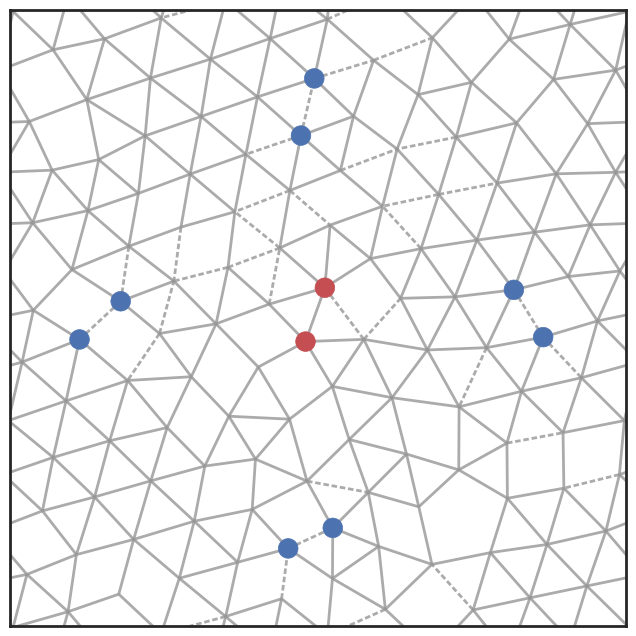

1


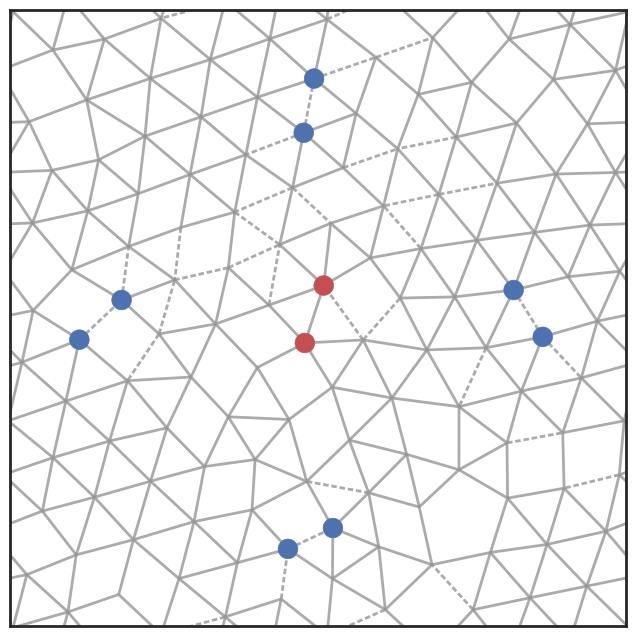

2


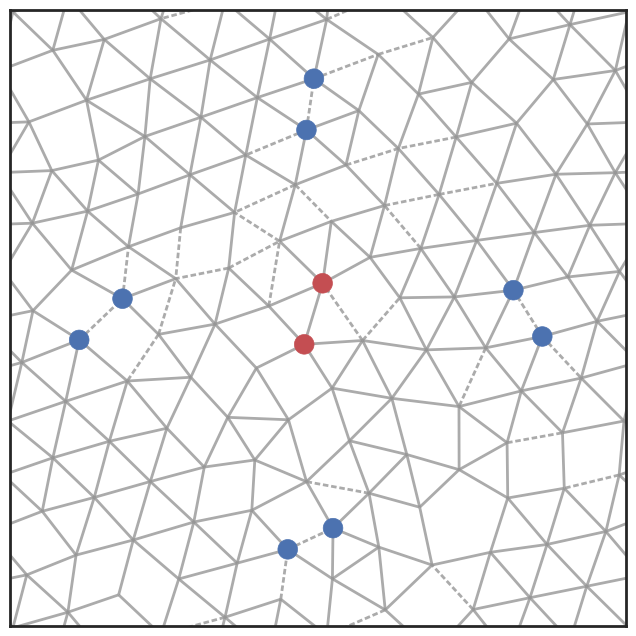

3


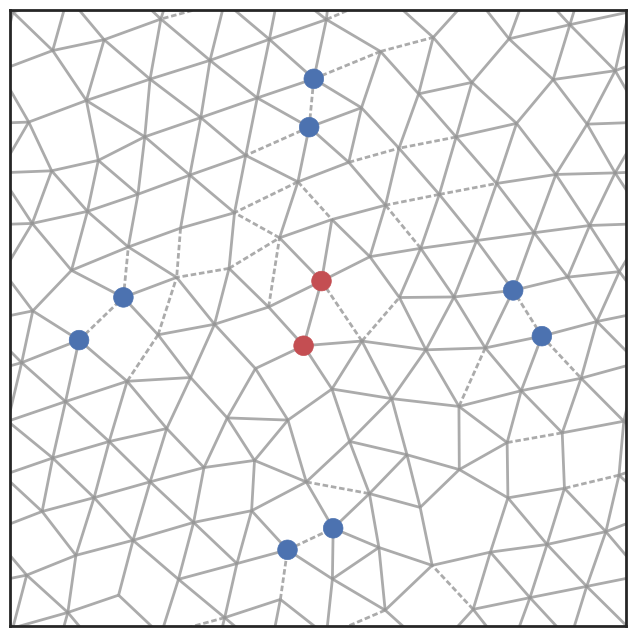

4


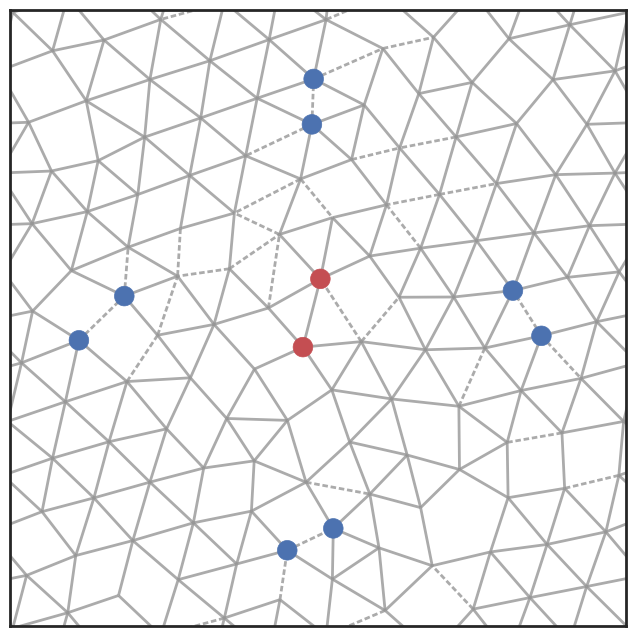

5


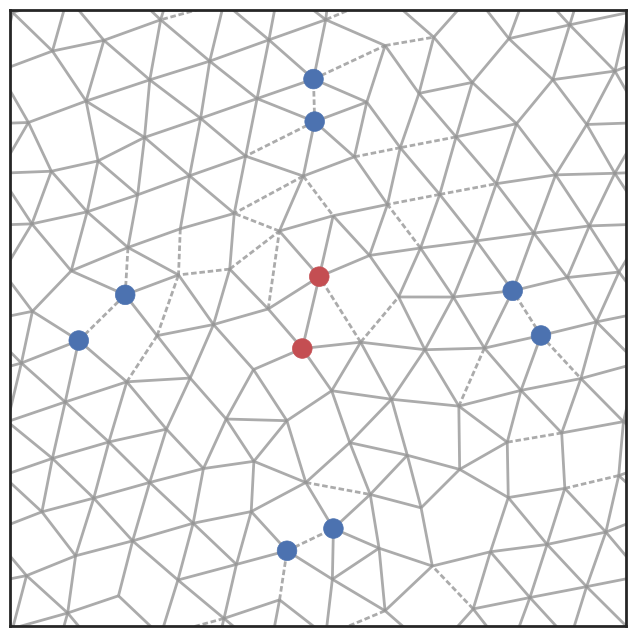

6


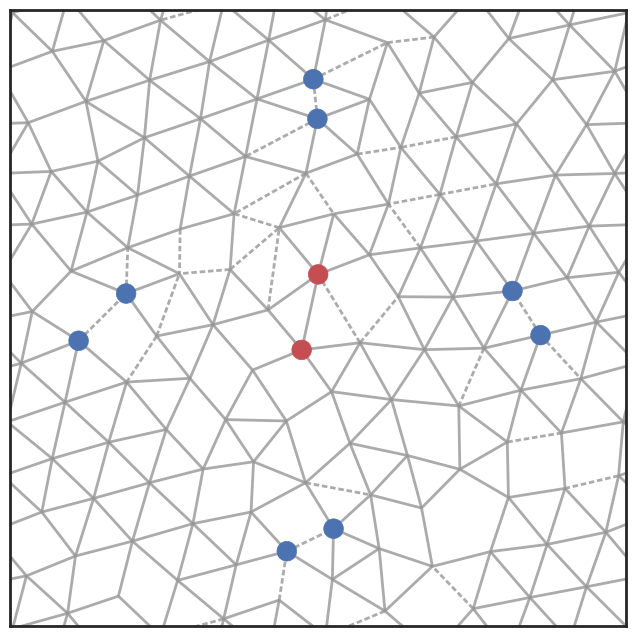

7


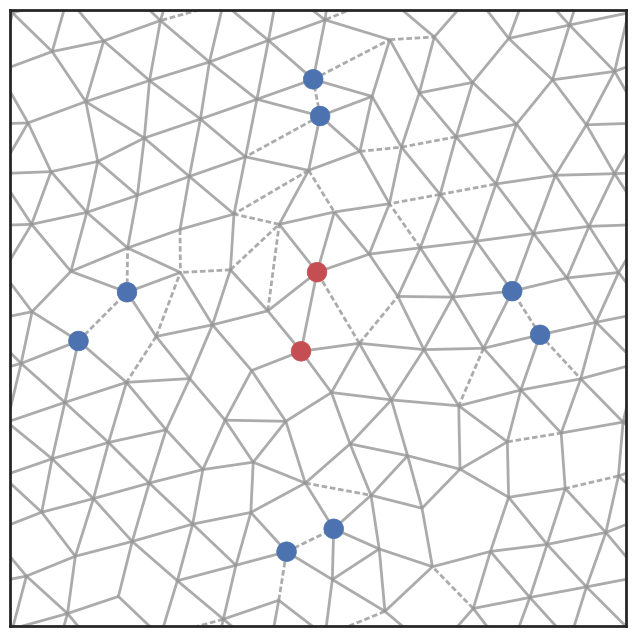

8


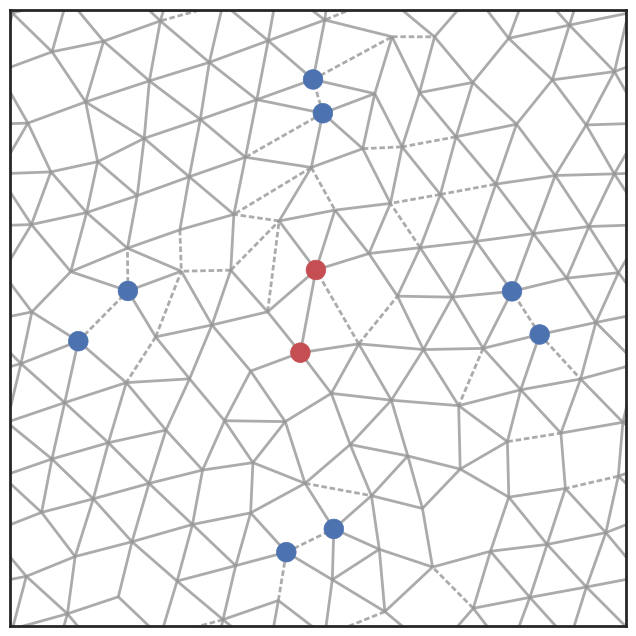

9


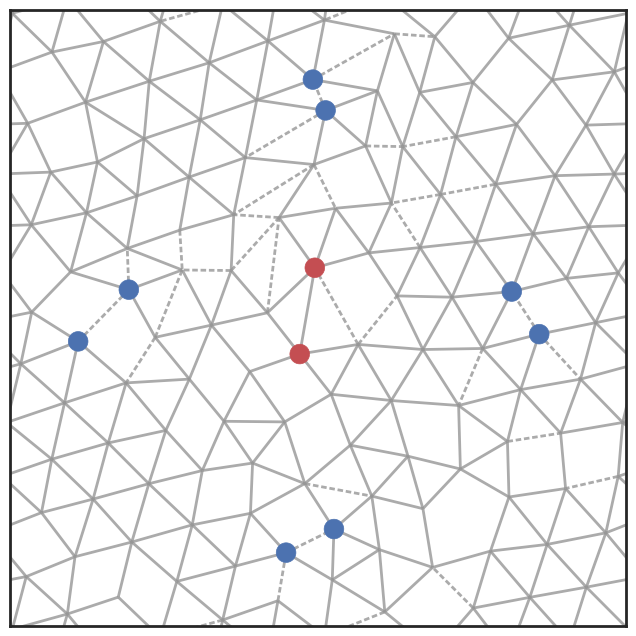

10


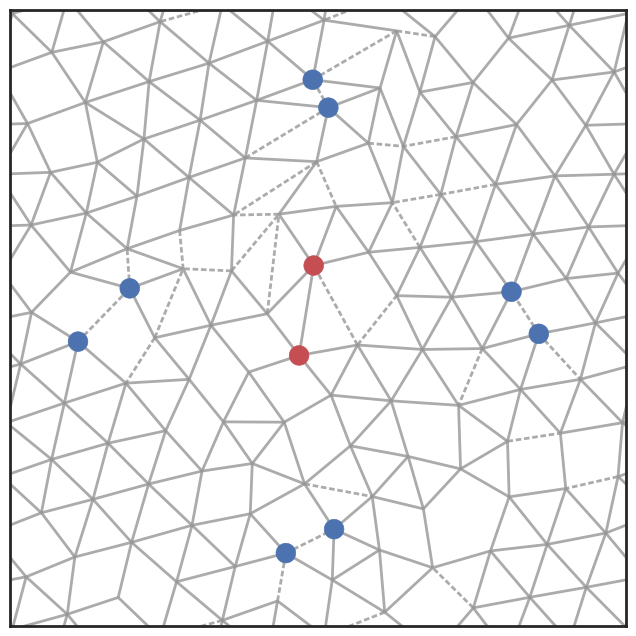

11


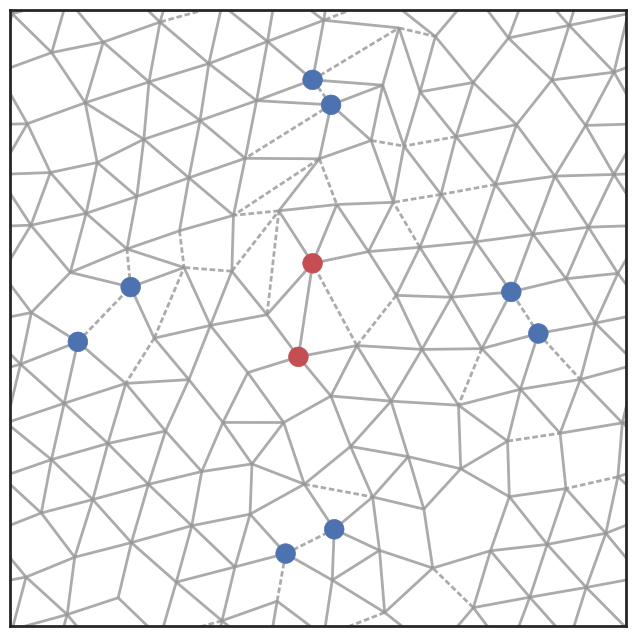

12


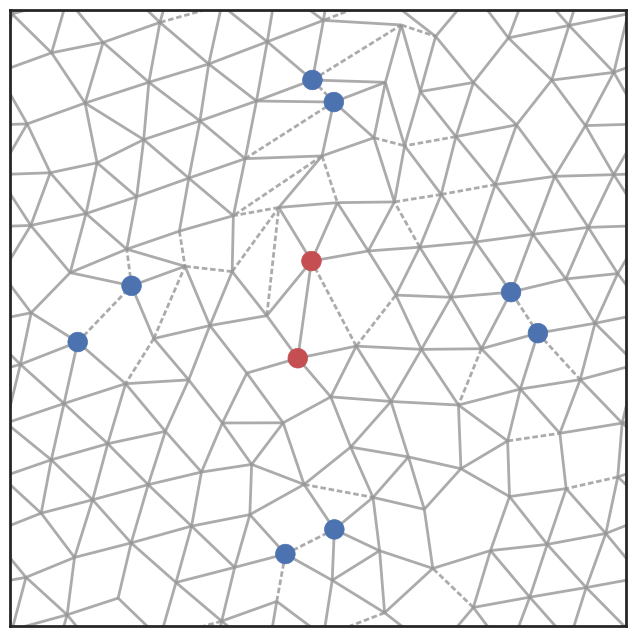

13


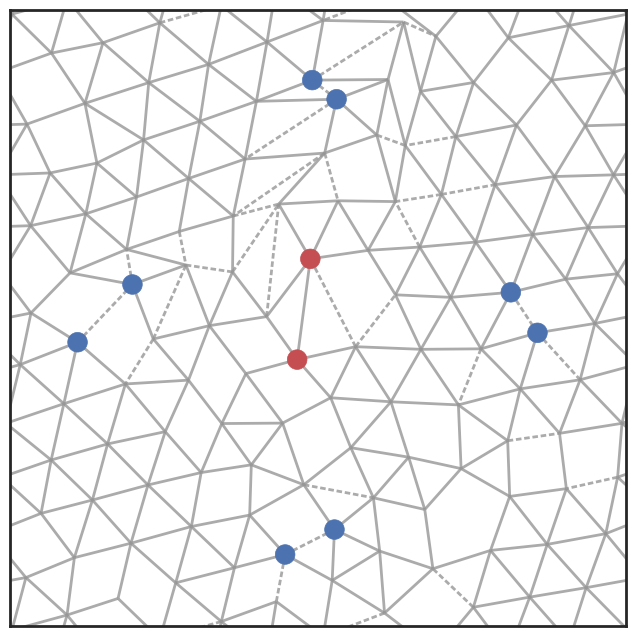

14


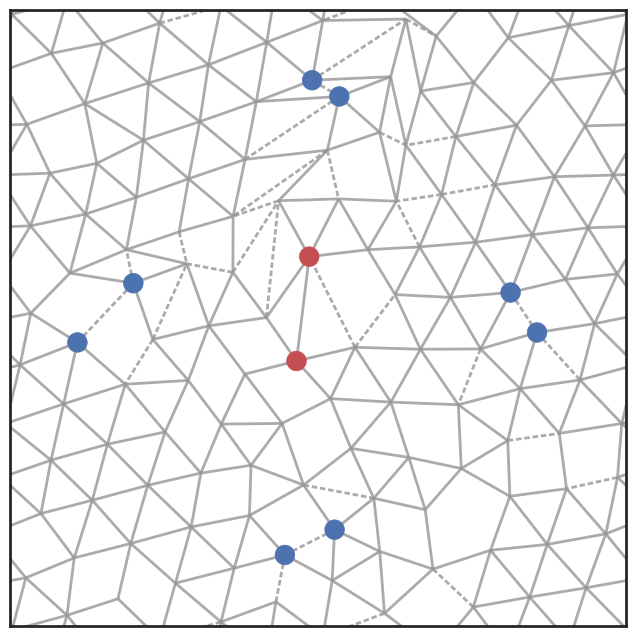

15


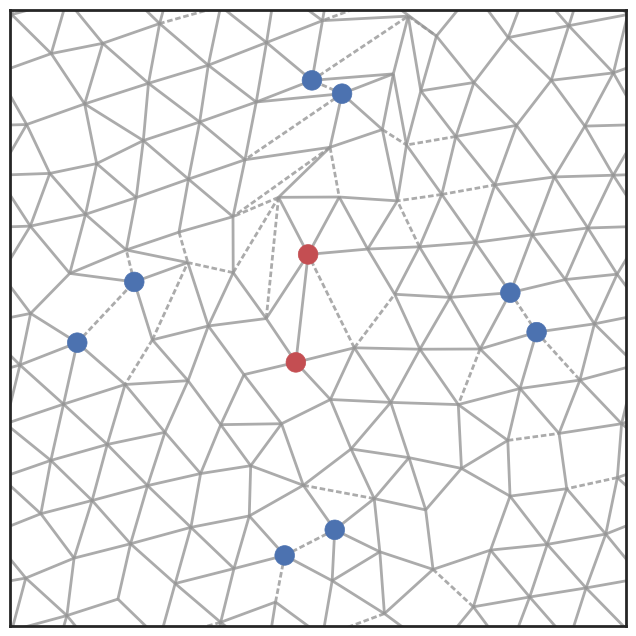

16


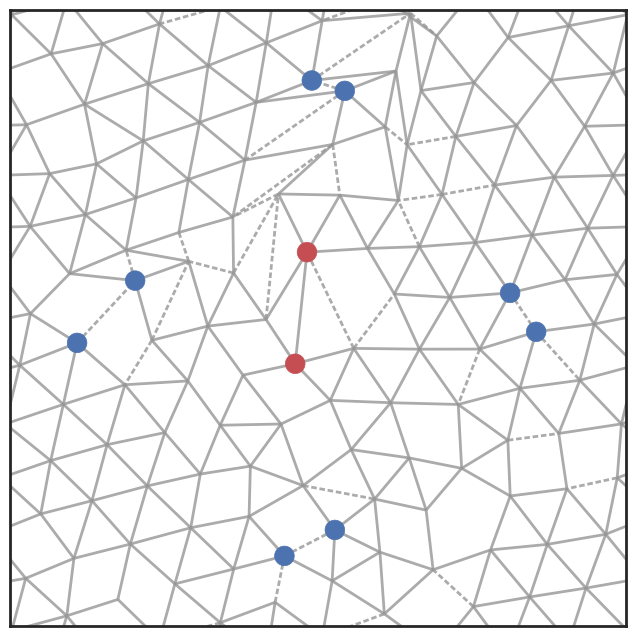

17


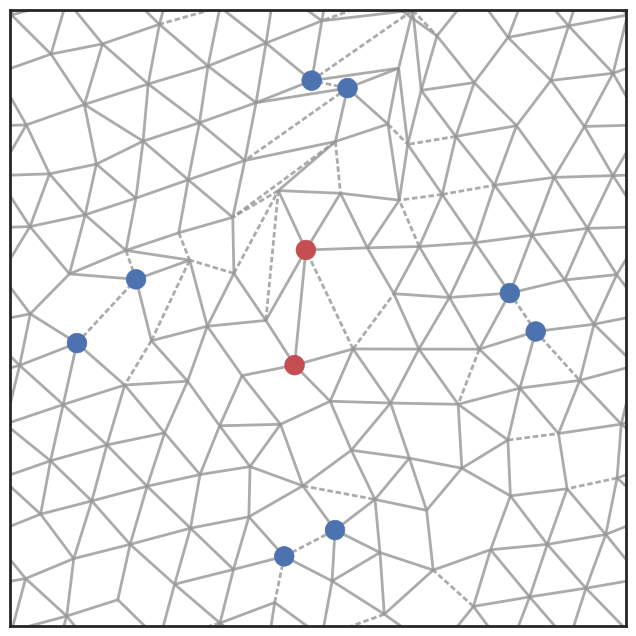

18


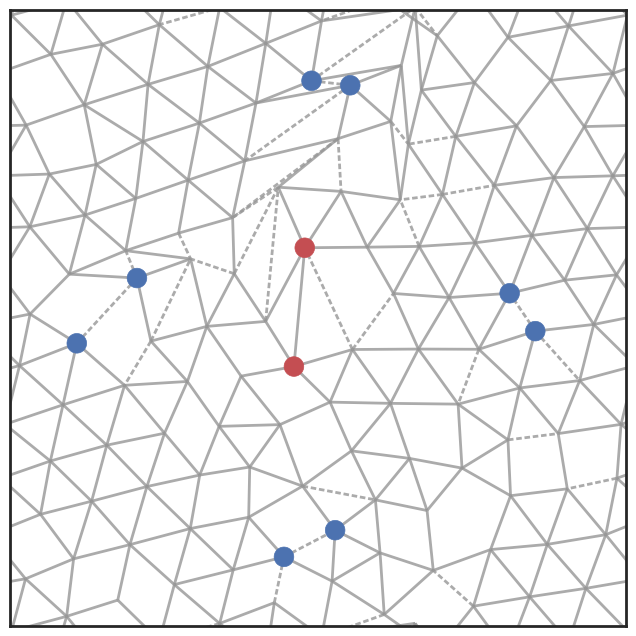

19


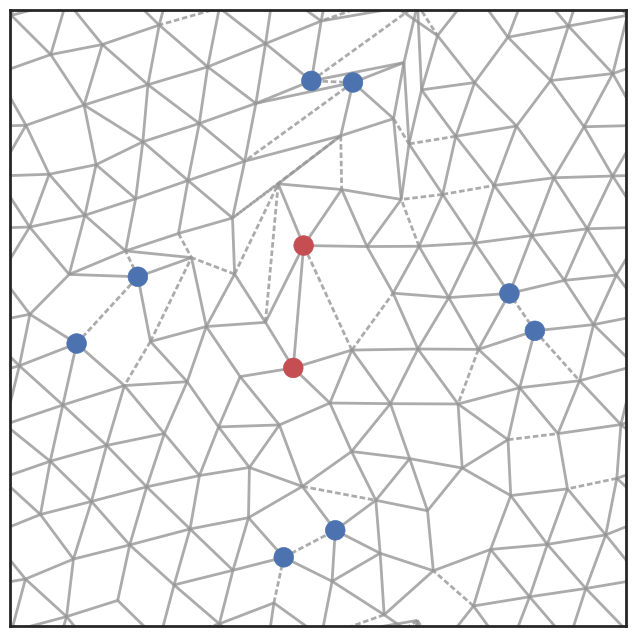

20


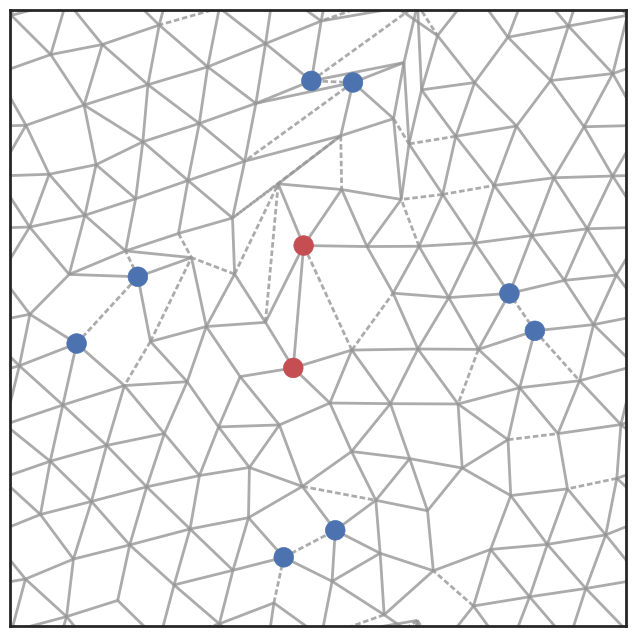

21


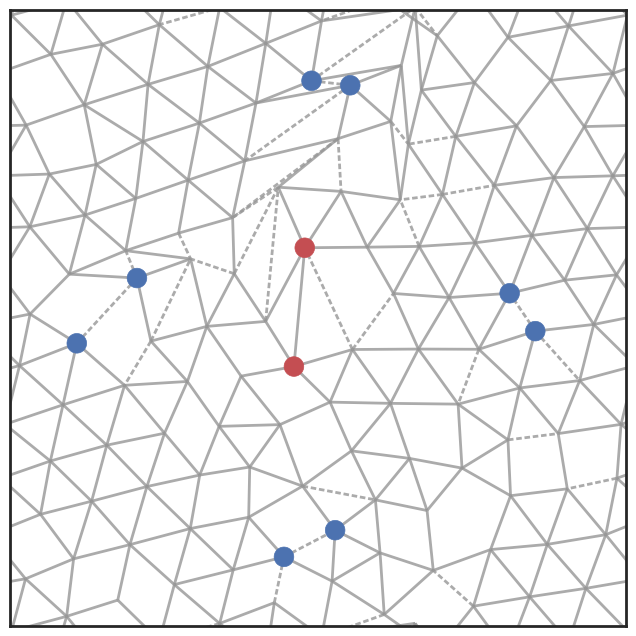

22


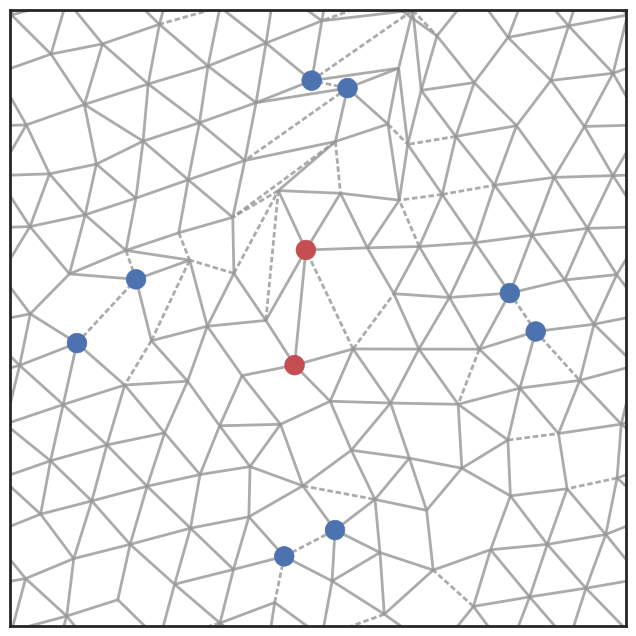

23


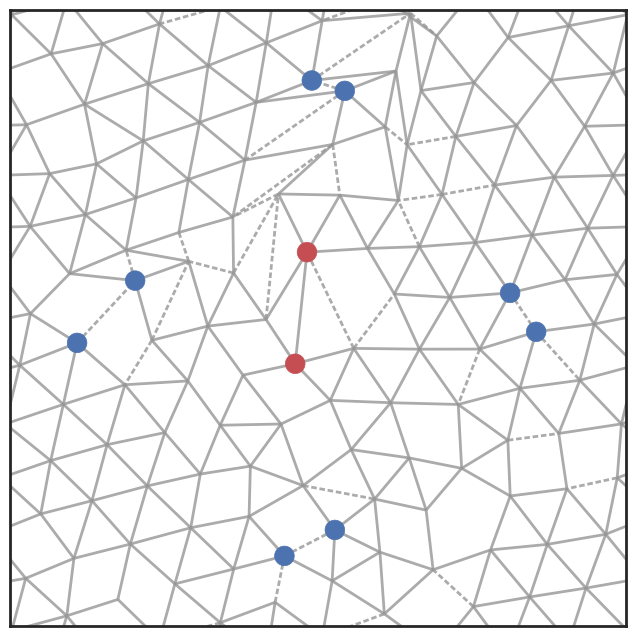

24


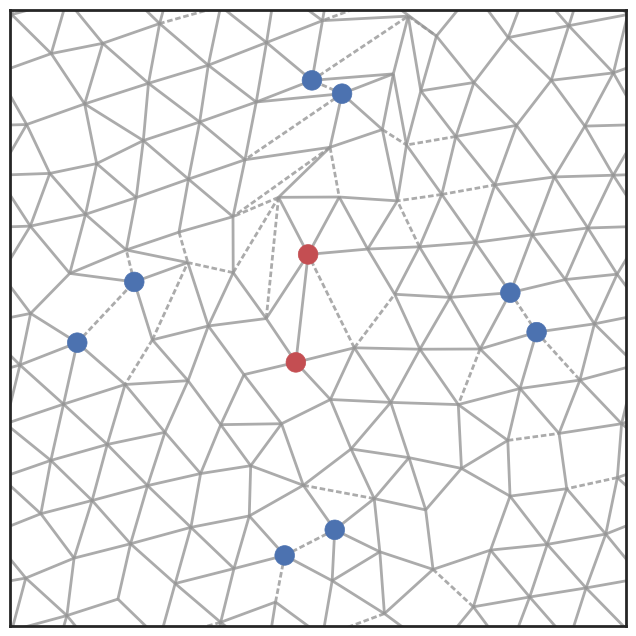

25


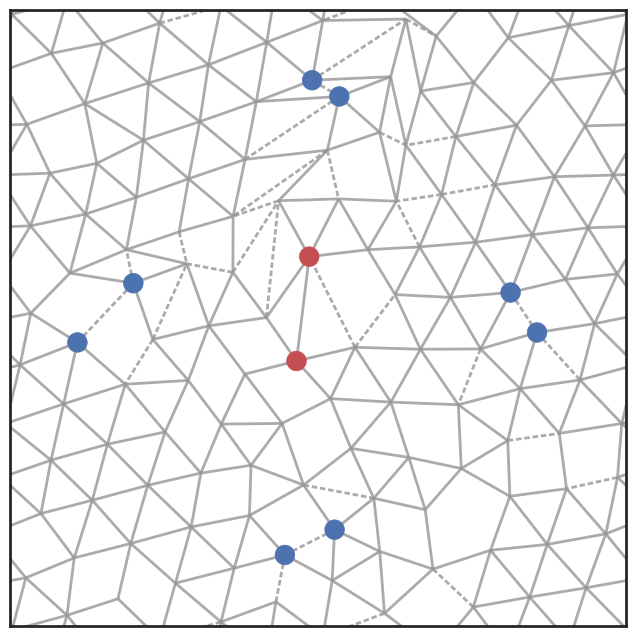

26


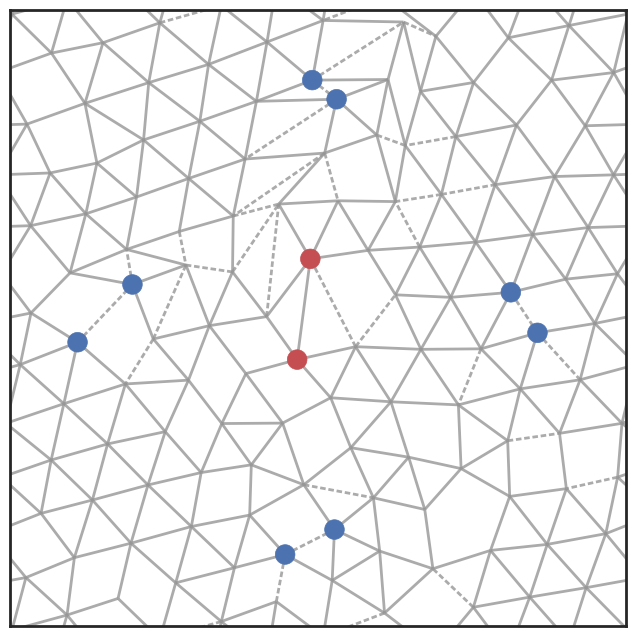

27


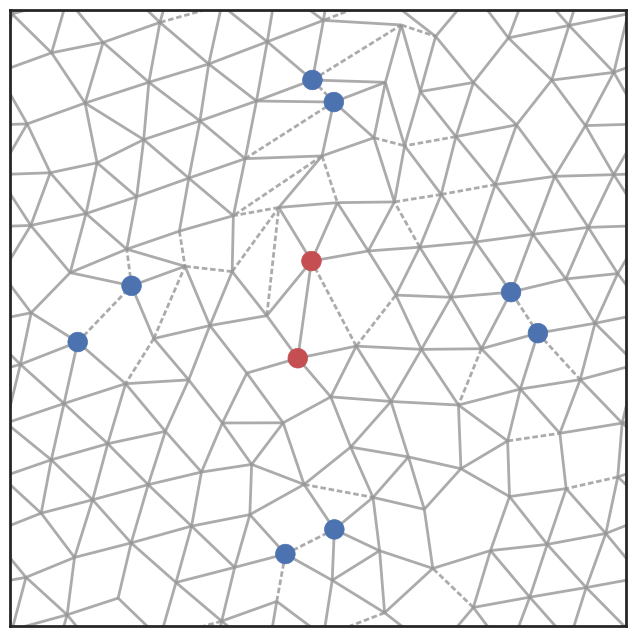

28


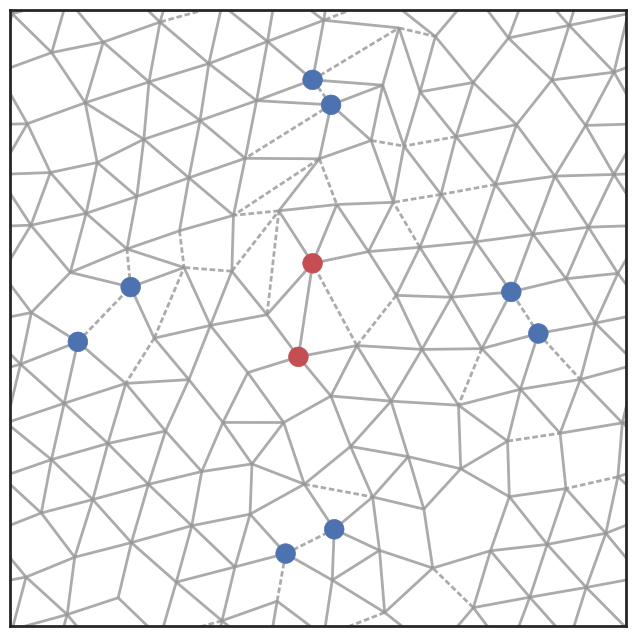

29


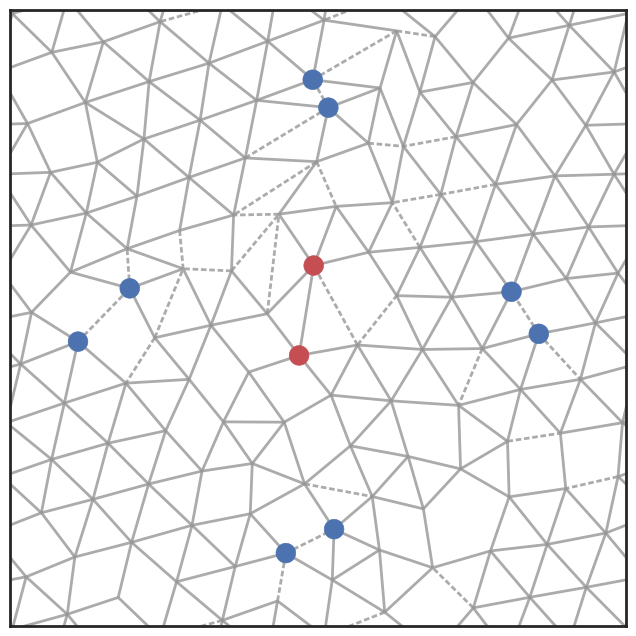

30


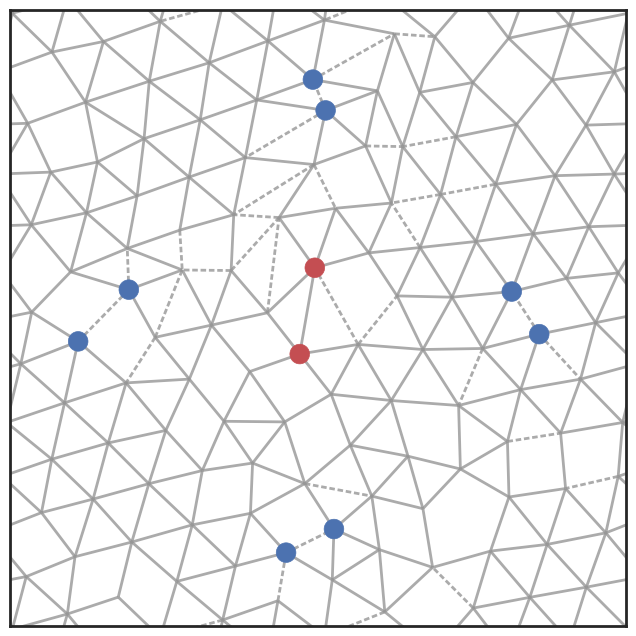

31


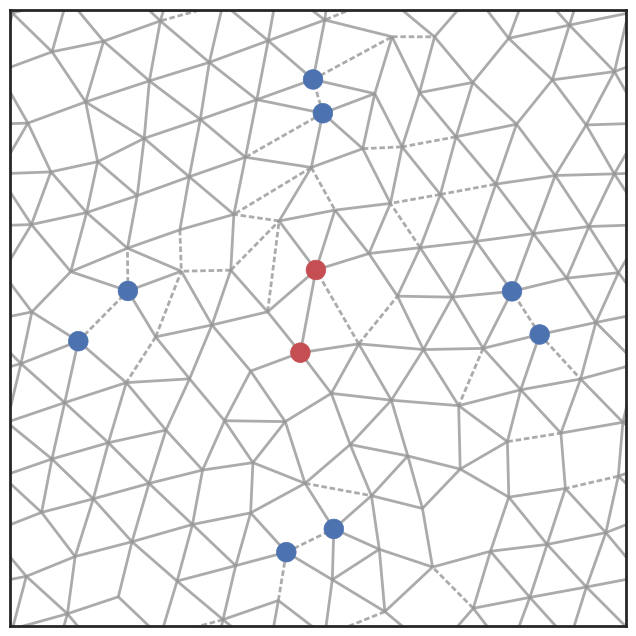

32


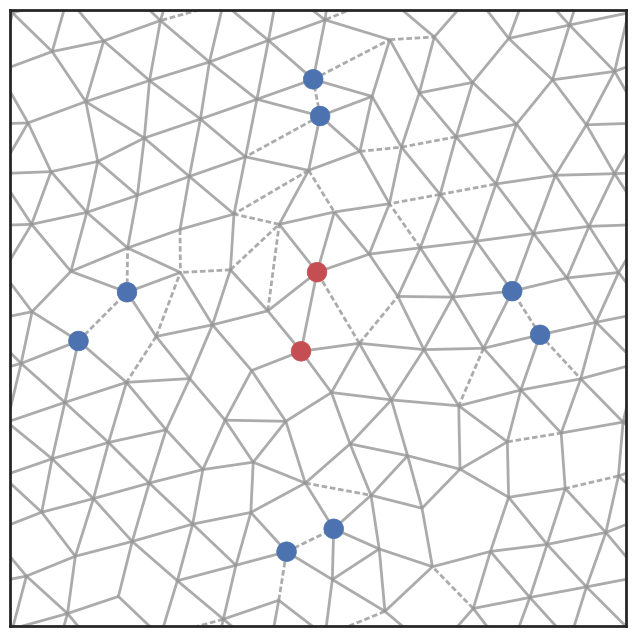

33


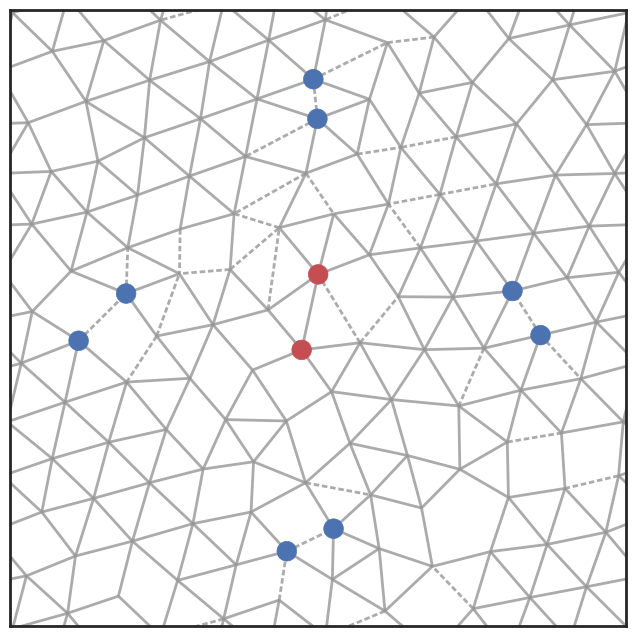

34


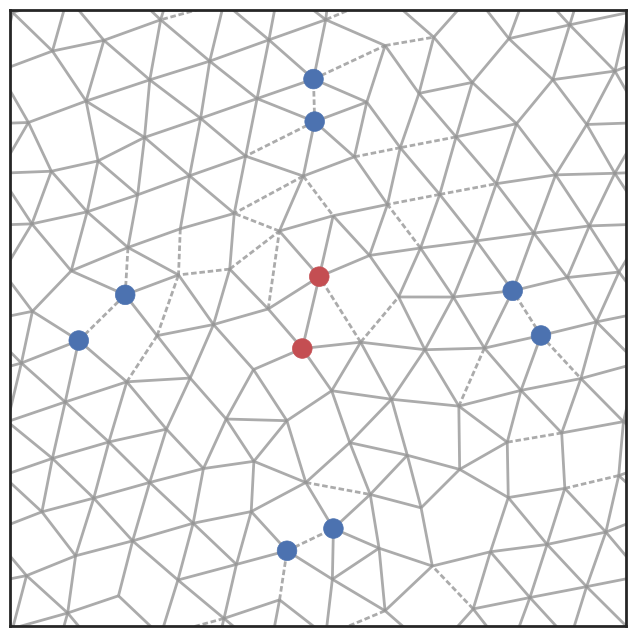

35


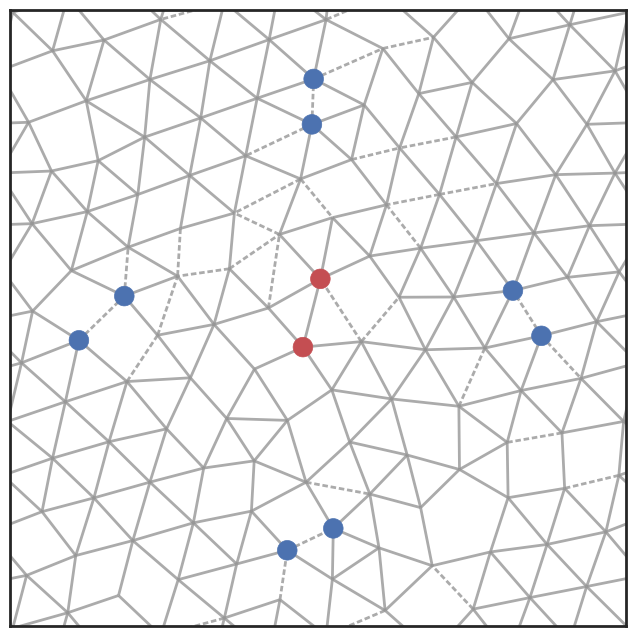

36


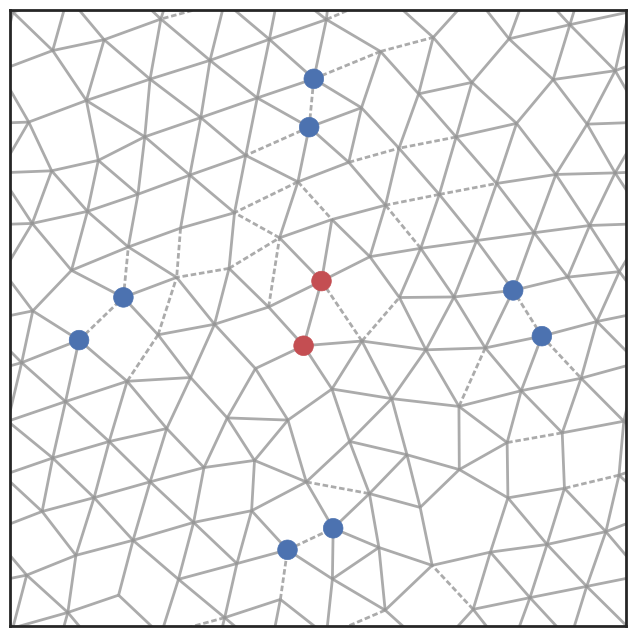

37


In [ ]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set(color_codes=True)
sns.set_context('poster', font_scale=1.25)
sns.set_palette("Set1", 8)
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fn = "network_2D_edge"
# fn = "network_2D_nodepair"
with open("{}.pkl".format(fn), 'rb') as pkl_file:
    data = pickle.load(pkl_file)
        
nw_label = data['network_label']
inodesi = data['istrain_nodesi'][0]
inodesj = data['istrain_nodesj'][0]
onodesi = data['ostrain_nodesi'][0]
onodesj = data['ostrain_nodesj'][0]
ostrain_edges = data['ostrain_edges'][0]

removed = np.where(data['K_disc'] == 0.0)[0]
disp = data['disp']
# disp = data['disp_init']


with open("/data1/home/rocks/data/{:}.pkl".format(nw_label), 'rb') as pkl_file:

    nw_data = pickle.load(pkl_file)
    net = nw_data['network'] 
    

edge_styles = {edge: {} for edge in range(net.NE)}
for edge in removed:
    edge_styles[edge]['ls'] = (0.0, (2.0,1.0))
    
node_styles = {}
for i in inodesi:
    node_styles[i] = {}
    node_styles[i]['color'] = 'r'
for i in inodesj:
    node_styles[i] = {}
    node_styles[i]['color'] = 'r'
    
for i in onodesi:
    node_styles[i] = {}
    node_styles[i]['color'] = 'b'
for i in onodesj:
    node_styles[i] = {}
    node_styles[i]['color'] = 'b'
    

max_amp = 1.0
n_steps = 20
amp_list = np.concatenate([np.linspace(0, max_amp, n_steps), np.linspace(max_amp, 0, n_steps)])

for i, amp in enumerate(amp_list):
    
    print i
    
    fig = plt.figure(figsize=(8,8))

    ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

    show_network(ax1, net, disp=amp*disp, styles=edge_styles)

    show_nodes(ax1, net, node_styles.keys(), disp=amp*disp, styles=node_styles)

    ax1.get_xaxis().set_ticks([])
    ax1.get_yaxis().set_ticks([])
    
    plt.savefig("frames/fig_{:04d}.png".format(i))
    
    plt.show()

In [ ]:
nplot.createGIF("frames/*.png", "{}.gif".format(fn))

In [8]:
nplot.createGIF("frames/*.png", "{}_init.gif".format(fn))